In [2]:
!pip install sklearn-pandas

/bin/bash: warning: setlocale: LC_ALL: cannot change locale (en_US.UTF-8)
Defaulting to user installation because normal site-packages is not writeable


In [22]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn_pandas import DataFrameMapper
import plotly.express as px 
import plotly.io as pio
pio.renderers.default = "browser"

In [2]:
df = pd.read_csv('../../data/gri_data/economy/fundamentals.csv', sep=";")


mapper = DataFrameMapper([(df.columns, StandardScaler())])
scaled_features = mapper.fit_transform(df.copy(), 4)
scaled_features_df = pd.DataFrame(scaled_features, index=df.index, columns=df.columns)
df.head()

,Accounts Payable,Accounts Receivable,Add'l income/expense items,After Tax ROE,Capital Expenditures,Capital Surplus,Cash Ratio,Cash and Cash Equivalents,Changes in Inventories,Common Stocks,...,Total Current Assets,Total Current Liabilities,Total Equity,Total Liabilities,Total Liabilities & Equity,Total Revenue,Treasury Stock,For Year,Earnings Per Share,Estimated Shares Outstanding
0,3.068000e+09,-222000000.0,-1.961000e+09,23.0,-1.888000e+09,4.695000e+09,53.0,1.330000e+09,0.0,127000000.0,...,7.072000e+09,9.011000e+09,-7.987000e+09,2.489100e+10,1.690400e+10,2.485500e+10,-367000000.0,2012.0,-5.60,3.350000e+08
1,4.975000e+09,-93000000.0,-2.723000e+09,67.0,-3.114000e+09,1.059200e+10,75.0,2.175000e+09,0.0,5000000.0,...,1.432300e+10,1.380600e+10,-2.731000e+09,4.500900e+10,4.227800e+10,2.674300e+10,0.0,2013.0,-11.25,1.630222e+08
2,4.668000e+09,-160000000.0,-1.500000e+08,143.0,-5.311000e+09,1.513500e+10,60.0,1.768000e+09,0.0,7000000.0,...,1.175000e+10,1.340400e+10,2.021000e+09,4.120400e+10,4.322500e+10,4.265000e+10,0.0,2014.0,4.02,7.169154e+08
3,5.102000e+09,352000000.0,-7.080000e+08,135.0,-6.151000e+09,1.159100e+10,51.0,1.085000e+09,0.0,6000000.0,...,9.985000e+09,1.360500e+10,5.635000e+09,4.278000e+10,4.841500e+10,4.099000e+10,0.0,2015.0,11.39,6.681299e+08
4,2.409453e+09,-89482000.0,6.000000e+05,32.0,-2.711820e+08,5.202150e+08,23.0,5.981110e+08,-260298000.0,7000.0,...,3.184200e+09,2.559638e+09,1.210694e+09,3.403120e+09,4.613814e+09,6.205003e+09,-27095000.0,2012.0,5.29,7.328355e+07


<Axes: xlabel='value', ylabel='variable'>

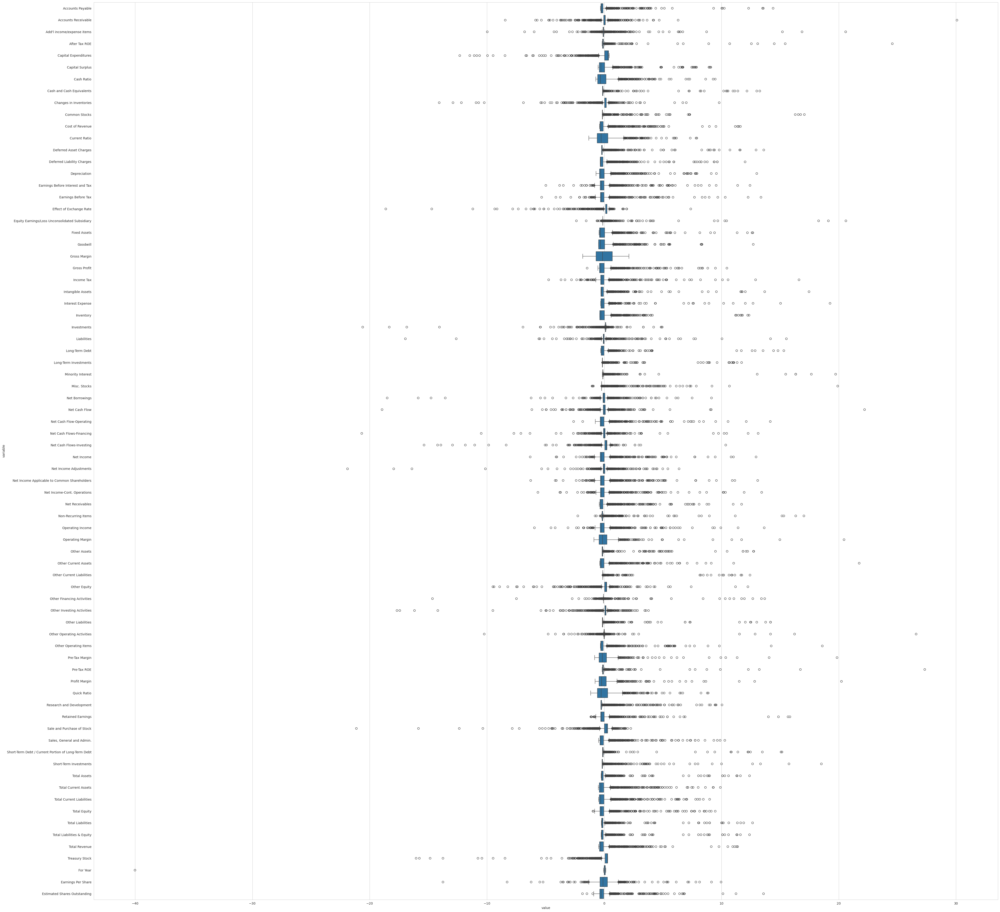

In [17]:
plt.figure(figsize=(50, 50))
sns.boxplot(y="variable", x="value", data=pd.melt(scaled_features_df))

In [25]:
fig = px.box(df, orientation='h')
fig.show()

In [21]:
import plotly.graph_objects as go
import pandas as pd
import plotly.io as pio
pio.renderers.default = "browser"

# Assuming scaled_features_df is your DataFrame
melted_df = pd.melt(scaled_features_df)

fig = go.Figure()

for variable in melted_df['variable'].unique():
    fig.add_trace(go.Box(
        y=melted_df[melted_df['variable'] == variable]['value'],
        name=variable,
        boxpoints='all',  # can also be outliers, or False
        jitter=0.3,
        pointpos=-1.8
    ))

fig.update_layout(
    title='Boxplot of Scaled Features',
    yaxis_title='Value',
    xaxis_title='Variable',
    height=1000,  # Adjust this value to change the height
    width=1000,   # Adjust this value to change the width
    showlegend=False
)

fig.show()

<a id='another_cell'></a>

137.0 76


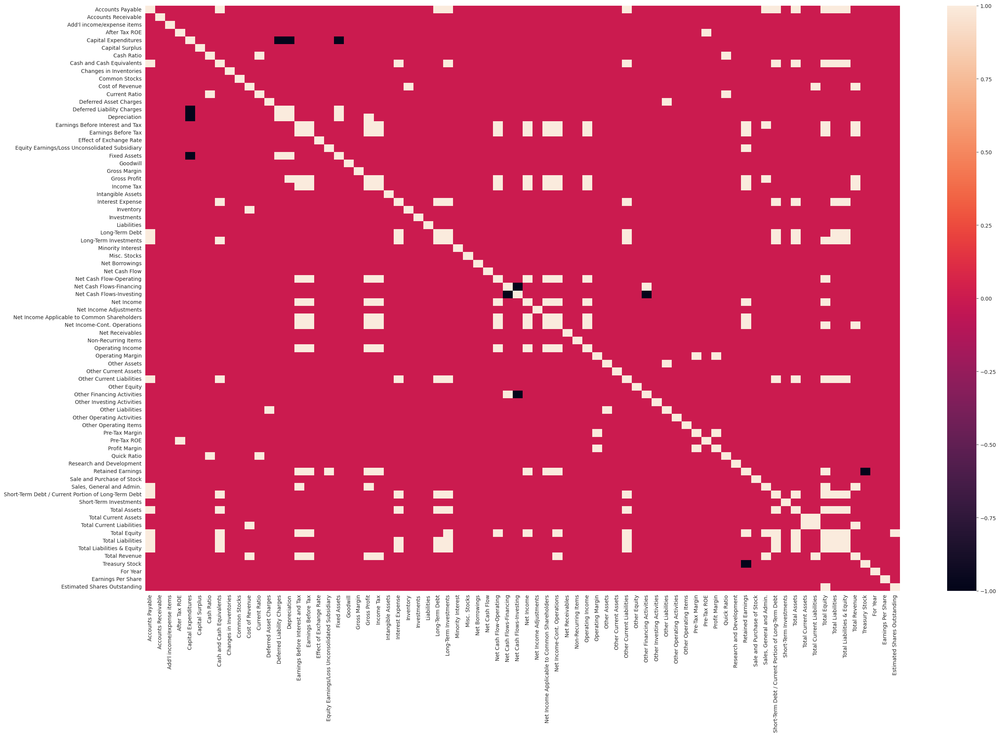

In [26]:
plt.figure(figsize=(32, 20))
def map_corr(x):
    if x > 0.7:
        return 1.0
    if -0.7 <= x <= 0.7:
        return 0.0
    return -1

corr = scaled_features_df.corr().map(map_corr)
sns.heatmap(corr)
print(((corr== 1).sum().sum() + (corr== -1).sum().sum() - df.shape[1])/2, df.shape[1])

In [7]:


fig = px.line(df, x=df.index, y=df.columns)
fig.show()


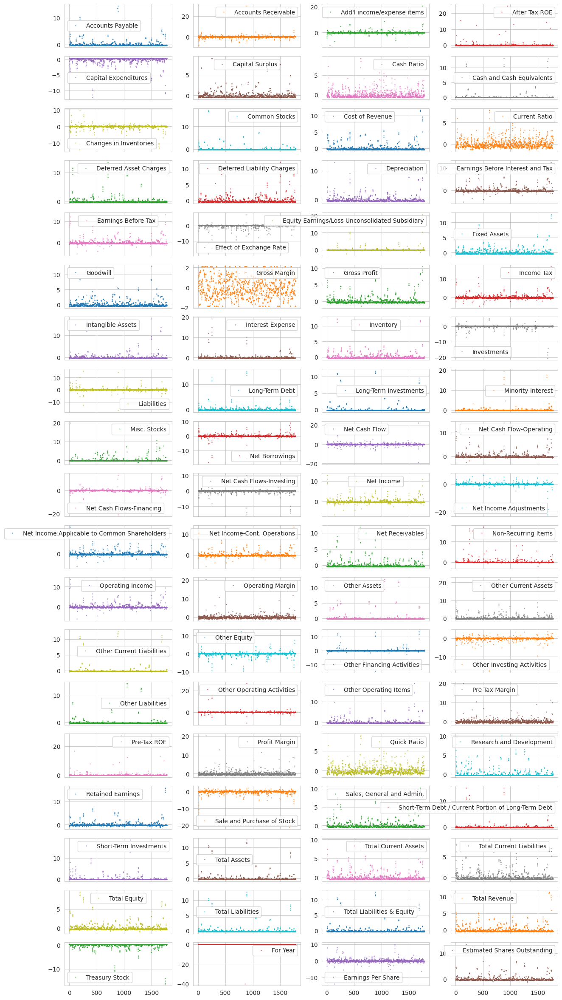

In [11]:
scaled_features_df.plot(lw=0, marker=".", subplots=True, layout=(-1, 4),
          figsize=(15, 30), markersize=1);

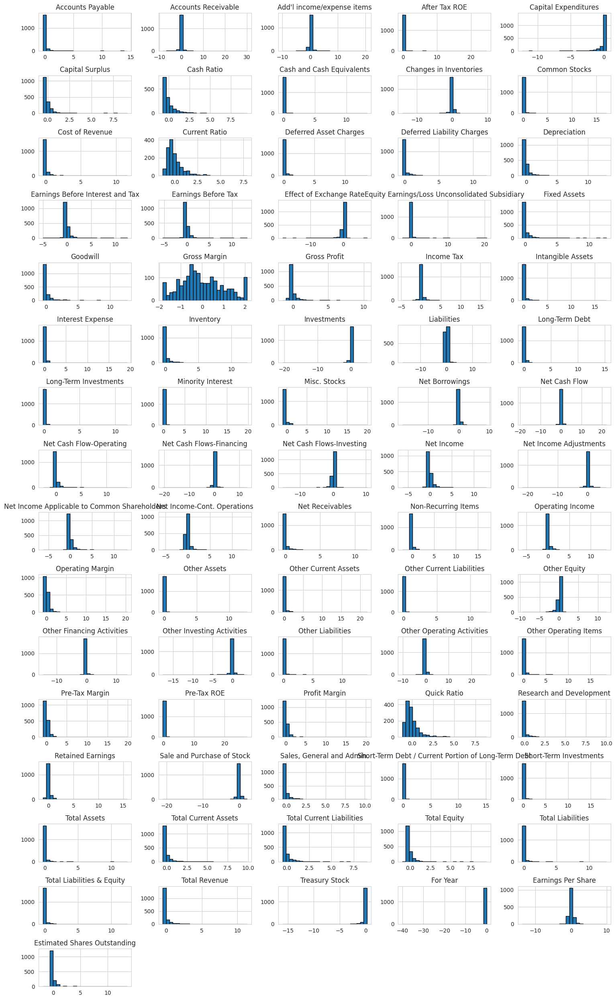

In [30]:
scaled_features_df.hist(bins=25, figsize=(15, 25), layout=(-1, 5), edgecolor="black")
plt.tight_layout();

In [14]:
sns.pairplot(scaled_features_df, height=1.5, plot_kws={"s": 2, "alpha": 0.2})

In [32]:
import numpy as np
# total collagen (mg/g dry weight of liver)
x = np.array([[7.1, 7.1, 7.2], [8.3, 9.4, 10.5]])
# free proline (μ mole/g dry weight of liver)
y = np.array([[2.8, 2.9, 2.8, 2.6], [3.5, 4.6, 5.0]])

from scipy import stats
res = stats.spearmanr(x, y)
res.statistic

ValueError: setting an array element with a sequence. The requested array has an inhomogeneous shape after 1 dimensions. The detected shape was (2,) + inhomogeneous part.